In [1]:
import matplotlib
import matplotlib.dates as mdates

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.pyplot import figure
from mpl_toolkits import mplot3d
from sklearn.model_selection import (GridSearchCV, ShuffleSplit,
                                     train_test_split)
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.svm import SVR
from sklearn.inspection import permutation_importance


In [15]:

filepath = r'realestate.xls'
sheetname = 'realestate'
#replace all_columns with individual dropdown values
dataframe = pd.read_excel(filepath, sheet_name=sheetname, mangle_dupe_cols=True)

print(type(dataframe))
tot = len(dataframe.columns.values)
print(tot)
X_columns = dataframe.columns.values[1:tot-2]
X = dataframe[X_columns]
y_column = dataframe.columns.values[tot-1]
print(dataframe.columns.values[1:tot-1],dataframe.columns.values[tot-1])
y = dataframe[[y_column]]
type(X)
type(y)

<class 'pandas.core.frame.DataFrame'>
8
['X1 transaction date' 'X2 house age'
 'X3 distance to the nearest MRT station'
 'X4 number of convenience stores' 'X5 latitude' 'X6 longitude'] Y house price of unit area


pandas.core.frame.DataFrame

In [16]:
y = y.round(4)
X = X.round(4)
df = pd.DataFrame()
#remove any trailing spaces in column names
X.columns = X.columns.str.strip()
y.columns = y.columns.str.strip()
X.columns = X.columns.str.replace("[^a-zA-Z\d\_]+", "")
y.columns = y.columns.str.replace("[^a-zA-Z\d\_]+", "")
#check if there are any columns of string type 
#(if so, trim and remove any special characters)
if X.columns[X.dtypes=='str'].dtype == 'str':
    X.columns[X.dtypes=='str'].data.str.strip()
else:
    print("No string datatypes in dataframe!")
if y.columns[y.dtypes=='str'].dtype == 'str':
    y.columns[y.dtypes=='str'].data.str.strip()
else:
    print("No string datatypes in dataframe!")

#look for any null/missing values 
X.isnull().values.any()
#may not need to chekc for nulls in y - it may be valid value
#y.isnull().values.any()

#scale/normalize the values for plotting features
X.columns = pd.io.parsers.ParserBase({'names':X.columns})._maybe_dedup_names(X.columns)
#X = X[X.T[X.any()].T.columns.values]
X = X[X.columns[(X != 0).any()] ]
y=pd.DataFrame(y.iloc[:,:],columns=y.columns.values)
standardy = StandardScaler()
standardX = StandardScaler()
scaled_y=standardy.fit_transform(y.values.reshape(-1,1))
scaled_X=standardX.fit_transform(X)
X.loc[:,:] = scaled_X
y.loc[:,:] = scaled_y
features = X.columns.values
response_column_name = y.columns.values[0]
df = pd.concat([X, y],  axis=1)
X = X
y = y
X = X.iloc[:, 0:]

No string datatypes in dataframe!
No string datatypes in dataframe!


In [17]:
ss_data = ShuffleSplit(n_splits=10, train_size=0.5, test_size=.5,random_state=0)
target = pd.DataFrame(y.iloc[:, 0])
validation_y = target[-90:-1]
validation_X = X[-90:-1]
for train_index, test_index in ss_data.split(X):
    X_train, X_test = X[:len(train_index)], X[len(train_index): (len(train_index)+len(test_index))]
    y_train, y_test = target[:len(train_index)].values.ravel(), target[len(train_index): (len(train_index)+len(test_index))].values.ravel()

In [18]:
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LassoCV, BayesianRidge
from sklearn.linear_model import Lasso
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import GridSearchCV
from sklearn import preprocessing
from sklearn import model_selection

from sklearn.svm import SVC
from mpl_toolkits import mplot3d
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.exceptions import *

In [19]:
rmse = dict()
r2 = dict()
expvarscore = dict()

In [20]:
dt = DecisionTreeRegressor(random_state=0)

benchmark_dt=dt.fit(X_train, y_train)
#solutionmodels[constants_obj.BENCHMARK] = benchmark_dt
#plot the benchmark results

#joblib.dump(dt, folder_path+'benchmark_model.pkl')
#plot_benchmark_permutation_importance(benchmark_dt, X_train, y_train)

ss = model_selection.ShuffleSplit(n_splits=10, random_state=7)
lab_enc = preprocessing.LabelEncoder()
y_train_encoded = lab_enc.fit_transform(y_train)

cvresults = model_selection.cross_validate(benchmark_dt, X_train, 
                    y_train, cv=ss, scoring=['neg_mean_squared_error', 'explained_variance', 'r2'], n_jobs=5)
rmse["dtr"] = cvresults['test_neg_mean_squared_error'].tolist()
r2["dtr"] = cvresults['test_r2'].tolist()
expvarscore["dtr"] = cvresults['test_r2'].tolist()

ytrain_actual = standardy.inverse_transform(y_train)
#[:,0]
ytest_actual = standardy.inverse_transform(y_test)
#[:,0]
print(cvresults)

{'fit_time': array([0.0070014 , 0.00600028, 0.0070014 , 0.00600219, 0.00700188,
       0.00599766, 0.00600076, 0.00599766, 0.00600219, 0.00500178]), 'score_time': array([0.00299978, 0.00400448, 0.00299978, 0.00299954, 0.00399876,
       0.00400281, 0.00399733, 0.0030036 , 0.00299811, 0.00199842]), 'test_neg_mean_squared_error': array([-0.55167614, -0.55016975, -0.79490508, -0.40659273, -0.21175845,
       -0.3329433 , -0.22551901, -0.56245035, -0.54959801, -0.48758395]), 'test_explained_variance': array([0.2243857 , 0.41050939, 0.50812619, 0.68963531, 0.68115018,
       0.6568155 , 0.73547631, 0.26742972, 0.34259414, 0.44717951]), 'test_r2': array([0.22350224, 0.40686189, 0.43076943, 0.62854388, 0.66408579,
       0.63201554, 0.67126049, 0.24105477, 0.30041621, 0.3876166 ])}


In [21]:
ypred_test = dt.predict(X_test)
ypred_test = standardy.inverse_transform(ypred_test)
yactual_test = standardy.inverse_transform(y_test)
ypred_train = dt.predict(X_train)
ypred_train = standardy.inverse_transform(ypred_train)
yactual_train = standardy.inverse_transform(y_train)
print(ypred_train)

[37.9  42.2  47.3  54.8  43.1  32.1  40.3  46.7  18.8  22.1  41.4  58.1
 39.3  23.8  34.3  50.5  70.1  37.4  42.3  47.7  29.3  51.6  24.6  47.9
 38.8  27.   56.2  33.6  47.   57.1  22.1  25.   34.2  49.3  55.1  27.3
 22.9  25.3  47.7  46.2  15.9  18.2  34.7  34.1  53.9  38.3  42.   61.5
 13.4  13.2  44.2  20.7  27.   38.9  51.7  13.7  41.9  53.5  22.6  42.4
 21.3  63.2  27.7  55.   25.3  44.3  50.7  56.15 36.2  42.   58.55 40.8
 36.3  17.8  54.4  29.5  36.8  25.6  29.8  26.55 40.3  36.8  48.1  17.7
 43.7  50.8  27.   18.3  48.   25.3  45.4  43.2  21.8  16.1  41.   51.8
 60.85 34.6  51.   60.85 38.2  32.9  54.4  45.7  30.5  71.   47.1  26.6
 34.1  28.4  51.6  39.4  23.1   7.6  53.3  46.4  12.2  13.   30.6  59.6
 31.3  44.05 32.5  45.5  57.4  48.6  62.9  55.   60.7  41.   37.5  30.7
 37.5  39.5  42.2  20.8  46.8  47.4  43.5  42.5  51.4  28.9  37.5  44.05
 28.4  45.5  52.2  43.2  45.1  39.7  48.5  44.7  28.9  40.9  20.7  17.8
 18.3  35.6  39.4  37.4  57.8  39.6  11.6  56.15 55.2  30.6  73

In [22]:
from sklearn.metrics import mean_squared_error, r2_score
#mse_train = mean_squared_error(yactual_train, ypred_train)
mse_test = mean_squared_error(yactual_test, ypred_test)
#r2_train = r2_score(yactual_train, ypred_train)
r2_test = r2_score(yactual_test, ypred_test)
print( mse_test, r2_test )

109.9127536231884 0.42127257267840346


In [23]:
import dash
from dash import Dash
import dash_html_components as html
import dash_core_components as dcc
import dash_table

import pandas as pd

from flask import request
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import requests as req
from dash.dependencies import Input, Output
#import chart_studio.plotly.plotly as py
import plotly.offline as py
import numpy as np
import requests
import sys
import chart_studio.dashboard_objs as dashboard

In [24]:
def plot_result(ypred, y, title):
    fig = go.Figure()
    fig.add_trace( go.Scatter(
        x= y,
        y = ypred,
        mode='markers',
        marker=dict(
            size=10,
            color='black',
        )
    ))
    xrange=np.linspace(y.min(), y.max(), 100)
    yrange=np.linspace(ypred.min(), ypred.max(), 100)

    fig.add_trace(go.Scatter(x=xrange, y=yrange,
                    mode='lines',
                    name='lines',marker_color='blue'))
    fig.update_layout(
        title=title,
        xaxis_title="Observed",
        yaxis_title="Predicted",
        legend_title="Test Set",
        paper_bgcolor = 'rgb(251, 251, 251)',
        plot_bgcolor = 'rgb(251, 251, 251)',
        height=450, #width=1000, 
        margin=dict(
                l=50,
                r=20,
                b=100,
                t=100,
                pad=10
            ),
        xaxis=dict(gridcolor='DarkGrey', showline=True, linecolor='DarkGrey', zeroline=True, zerolinecolor='DarkGrey'),
        yaxis=dict(gridcolor='DarkGrey', showline=True, linecolor='DarkGrey', zeroline=True, zerolinecolor='DarkGrey'),
    )
    fig.show()

In [25]:
plot_result(ypred_test, y_test, "Compression strength: Decision Tree Regression on Test set")

In [26]:
import json
from json import JSONEncoder
from collections import namedtuple
from reg import model_parameters
def model_params_decoder(obj):
    if '__type__' in obj and obj['__type__'] == 'ModelParameters':
        return model_parameters.ModelParameters(obj['svr_params_obj'], obj['rfr_params_obj'], obj['lasso_params_obj'], obj['br_params_obj'])
    return obj
with open('fixtures\params.json') as f:
    model_params_obj = json.load(f, object_hook=model_params_decoder)
print(model_params_obj.rfr_params_obj)

In [27]:
type= 'linear'
lin_svr = SVR(kernel=type)

svr_feat = lin_svr.fit(X_train, y_train)

#hyperparameter tuning using GridSearch CV
lin_svr_parameters = {
    'C': model_params_obj.svr_params_obj.svr_list_c,
    'epsilon':model_params_obj.svr_params_obj.svr_list_espilon,
    }
lin_gridsearch_svr_feat = GridSearchCV(estimator=svr_feat, 
param_grid=lin_svr_parameters, scoring=['neg_mean_squared_error', 'explained_variance', 'r2'], 
cv=ss_data, n_jobs=5,refit='neg_mean_squared_error')

lin_gridsearch_svr_feat.fit(X_train, y_train)
#plot the scores
#plot_svr_permutation_importance(lin_gridsearch_svr_feat, X_train, y_train)

rmse["svr"] = lin_gridsearch_svr_feat.cv_results_['mean_test_neg_mean_squared_error'].tolist()
r2["svr"] = lin_gridsearch_svr_feat.cv_results_['mean_test_r2'].tolist()
expvarscore["svr"] = lin_gridsearch_svr_feat.cv_results_['mean_test_explained_variance'].tolist()


In [28]:
ypred_test = lin_gridsearch_svr_feat.predict(X_test)
ypred_test = standardy.inverse_transform(ypred_test)
yactual_test = standardy.inverse_transform(y_test)
ypred_train = lin_gridsearch_svr_feat.predict(X_train)
ypred_train = standardy.inverse_transform(ypred_train)
yactual_train = standardy.inverse_transform(y_train)
print(ypred_train)

[47.82198348 48.93243662 48.54703223 48.28745698 47.66490367 33.49485446
 39.70520037 46.69927632 10.41772717 35.04397607 33.24048263 53.8057709
 42.071565   29.11168117 45.58383416 36.95834727 51.65983788 37.99633931
 47.08952331 49.59883956 36.24862597 49.82758421 30.42715363 48.90410483
 34.87990616 32.23234668 48.04631889 42.77096392 42.46329188 46.75921227
 14.31719399 41.61606706 30.92996698 46.7572572  48.45105417 33.8488117
 31.90356359 32.02627271 46.61487411 46.27602206 16.78296419 17.73811796
 36.06545115 40.96745464 47.85519422 40.17946328 47.07122594 36.41927757
 13.91054579 12.09891632 41.58256282 24.76834901 34.10506736 42.49990817
 46.04358851 24.10218842 43.08953433 47.44536664 14.43162904 41.53996582
 34.53827385 50.62816255 31.216167   47.88546333 33.45731913 42.93657218
 48.47224368 47.1143197  42.7705501  46.44362564 54.49681673 34.9766477
 44.45595452 17.24470387 54.3659859  32.97689378 36.85738369 29.96057072
 32.85883326 29.42813074 44.84113009 38.42230929 46.74

In [29]:
from sklearn.metrics import mean_squared_error, r2_score
#mse_train = mean_squared_error(yactual_train, ypred_train)
mse_test = mean_squared_error(yactual_test, ypred_test)
#r2_train = r2_score(yactual_train, ypred_train)
r2_test = r2_score(yactual_test, ypred_test)
print( mse_test, r2_test )

92.79888141642299 0.5113828365672195


In [30]:
plot_result(ypred_test, y_test, "Compression strength: Support Vector Regression on Test set")

In [31]:
rfr = RandomForestRegressor(n_estimators=50, random_state=0)
rfr_feat = rfr.fit(X_train, y_train)

#hyperparameter tuning using GridSearch CV
rfr_parameters = {
    'n_estimators': model_params_obj.rfr_params_obj.rfr_list_n_estimators,
    'max_features': model_params_obj.rfr_params_obj.rfr_max_features,
    'max_depth': model_params_obj.rfr_params_obj.rfr_max_depth,
    }
rfr_gridsearch_feat = GridSearchCV(estimator=rfr_feat, 
param_grid=rfr_parameters, scoring=['neg_mean_squared_error', 'explained_variance', 'r2'], 
cv=ss_data, n_jobs=5, refit='neg_mean_squared_error')

rfr_gridsearch_feat.fit(X_train, y_train)
#plot the scores
#plot_rfr_permutation_importance(rfr_gridsearch_feat, _X_train, _y_train)

rmse["rfr"] = rfr_gridsearch_feat.cv_results_['mean_test_neg_mean_squared_error'].tolist()
r2["rfr"] = rfr_gridsearch_feat.cv_results_['mean_test_r2'].tolist()
expvarscore["rfr"] = rfr_gridsearch_feat.cv_results_['mean_test_explained_variance'].tolist()


In [32]:
ypred_test = rfr_gridsearch_feat.predict(X_test)
ypred_test = standardy.inverse_transform(ypred_test)
yactual_test = standardy.inverse_transform(y_test)
ypred_train = rfr_gridsearch_feat.predict(X_train)
ypred_train = standardy.inverse_transform(ypred_train)
yactual_train = standardy.inverse_transform(y_train)
print(ypred_train)

[41.70767855 43.54969992 48.26570244 48.80260552 46.63289747 29.27684596
 38.37209761 46.29101976 19.3577963  23.57539292 39.34021893 58.59120007
 39.73324585 23.7510418  35.5271018  46.7880826  69.05883306 39.29082083
 42.35902459 50.02796517 28.38592569 50.61568813 25.41307329 50.35592081
 39.27308806 26.88044207 55.11352028 39.2832522  42.96111474 51.41852958
 20.37549103 31.82665152 36.43423859 47.58932124 51.73702461 27.64755556
 23.61731743 26.67688445 46.78899052 49.11388778 16.04912434 18.81788052
 34.38029373 35.53492343 53.08015909 38.41848261 39.43405928 51.31380286
 16.18612647 14.69517196 40.2059972  22.05695231 27.14424822 38.55958099
 49.03696139 15.78462987 41.17153122 53.17209524 20.5970172  40.53829831
 23.48355977 58.72234789 25.31316025 53.39793687 25.16442231 44.53241238
 51.4626415  55.90259663 38.36457072 42.27663058 58.50525916 40.02146048
 39.30691502 17.56471517 53.9922963  28.03427322 41.49901115 24.90754438
 35.37958157 26.02620226 42.75530705 36.26395837 47

In [33]:
from sklearn.metrics import mean_squared_error, r2_score
#mse_train = mean_squared_error(yactual_train, ypred_train)
mse_test = mean_squared_error(yactual_test, ypred_test)
#r2_train = r2_score(yactual_train, ypred_train)
r2_test = r2_score(yactual_test, ypred_test)
print( mse_test, r2_test )

67.95599134525264 0.6421889658305342


In [34]:
plot_result(ypred_test, y_test, "Compression strength: Random Forest Regression on Test set")

In [35]:
alphas = np.logspace(model_params_obj.lasso_params_obj.minAlpha, model_params_obj.lasso_params_obj.maxAlpha,
num=model_params_obj.lasso_params_obj.lasso_n_alphas,base=np.e)
print('alphas', alphas)
lasso = Lasso(max_iter=model_params_obj.lasso_params_obj.lasso_max_iter, normalize=False, fit_intercept=True)
#initialize scores for each alpha
scores = np.empty_like(alphas)
weights = []
for i,a in enumerate(alphas):
    lasso.set_params(alpha=a)
    lasso.fit(X_train, y_train)
    weights.append(lasso.coef_)
    #add scores for each alpha
    scores[i] = lasso.score(X_train, y_train)
print('r-2',scores)
tuned_parameters = [{'alpha': alphas}]
n_folds = 6
gridsearch_lasso_cv = GridSearchCV(lasso, tuned_parameters, 
scoring=['neg_mean_squared_error', 'explained_variance', 'r2'], 
cv=n_folds, refit='neg_mean_squared_error')

gridsearch_lasso_cv.fit(X_train, y_train)

#plot_lasso_permutation_importance(gridsearch_lasso_cv, _X_train, _y_train)

rmse["lr"] = gridsearch_lasso_cv.cv_results_['mean_test_neg_mean_squared_error'].tolist()
r2["lr"] = gridsearch_lasso_cv.cv_results_['mean_test_r2'].tolist()
expvarscore["lr"] = gridsearch_lasso_cv.cv_results_['mean_test_explained_variance'].tolist()


alphas [4.53999298e-05 4.54521749e-05 4.55044802e-05 ... 4.47139200e+00
 4.47653758e+00 4.48168907e+00]
r-2 [0.64438273 0.64438273 0.64438273 ... 0.         0.         0.        ]


In [37]:
ypred_test = gridsearch_lasso_cv.predict(X_test)
ypred_test = standardy.inverse_transform(ypred_test)
yactual_test = standardy.inverse_transform(y_test)
ypred_train = gridsearch_lasso_cv.predict(X_train)
ypred_train = standardy.inverse_transform(ypred_train)
yactual_train = standardy.inverse_transform(y_train)
print(ypred_train)

[46.81649847 48.1373947  48.60822693 48.27635806 47.29853454 32.76084077
 38.57195343 46.57467131  9.41971534 34.88977306 33.05582044 53.65994148
 41.7590953  28.05233918 45.45519304 36.99566427 51.68697131 37.75179442
 46.93377832 49.17125924 36.17443314 49.79904186 30.28347817 48.59004565
 34.29607756 31.72838145 47.55135156 42.91933629 42.56350028 46.59679401
 13.77278326 40.55240558 30.39050647 46.54501542 47.7225649  33.04266853
 31.42371273 32.13679674 46.05842495 46.05583832 16.14439896 17.48459663
 35.88724761 39.95134211 48.25538383 39.41152533 46.72090493 36.41240883
 13.30546607 10.6964342  41.59071867 24.41930767 33.94176573 42.32797596
 45.75159006 23.8100253  42.66642012 47.28406867 13.74254692 41.47174457
 34.54738289 50.82380802 30.56333132 48.28700285 33.72838355 42.46168269
 48.39156665 47.46452595 42.46764451 45.86236405 54.56468943 34.53967488
 44.14969884 16.74889707 53.61642023 33.37341356 36.84405766 29.18583818
 32.34224816 29.29881495 45.04618409 37.90024267 46

In [38]:
from sklearn.metrics import mean_squared_error, r2_score
#mse_train = mean_squared_error(yactual_train, ypred_train)
mse_test = mean_squared_error(yactual_test, ypred_test)
#r2_train = r2_score(yactual_train, ypred_train)
r2_test = r2_score(yactual_test, ypred_test)
print( mse_test, r2_test )

92.05474053512599 0.5153009873149865


In [39]:
plot_result(ypred_test, y_test, "Compression strength: Lasso Regression on Test set")

In [40]:
def weight_vs_alpha_plot(weights, alphas, scores, features, is_save):
    """
    Pass in the estimated weight, the alpha value and the names
    for the features and plot the model's estimated coefficient weight 
    for different alpha values
    """
    fig = plt.figure(figsize = (8, 6))

    # ensure that the weight is an array
    weight = np.array(weights)
    for col in range(weight.shape[1]):
        #print(weight[:, col])
        plt.plot(np.log(alphas), weight[:, col], label = features[col])

    plt.axhline(0, color = 'black', linestyle = '--', linewidth = 3)

    # manually specify the coordinate of the legend
    plt.legend(bbox_to_anchor = (1.3, 0.9))
    plt.title('Coefficient Weight as Alpha Grows')
    plt.ylabel('Coefficient weight')
    plt.xlabel('alpha')
    fig.show()

    fig2 = plt.figure(figsize = (8, 6))
    plt.plot(alphas, scores, '-ko')
    plt.xlabel('log '+r'$\alpha$')
    plt.ylabel('R-2')
    plt.xscale('log')
    plt.title('Pre-parameter-tuning R-2 scores for alphas')
    sns.despine(offset=15)
    fig2.show()

In [41]:
def weights_vs_alphas(weights, alphas, features):
    figure = go.Figure()
    weight = np.array(weights)
    z = np.zeros((1000,))
    weight = np.array(weights)
    for column in range(weight.shape[1]):
        figure.add_trace(go.Scatter(x=np.log(alphas),
            y=weight[:,column],
            name=features[column], line=dict(width=3)
        ))
    figure.update_yaxes(
        ticktext=[features],
    )
    figure.add_trace(go.Scatter(x=alphas,y=z,
                            line = dict(color='black', width=3, dash='dash'), 
                            name="axis line"))
    figure.update_traces(hoverinfo='text+name', mode='lines')

    figure.update_layout(xaxis_showgrid=False, yaxis_showgrid=False,
    title_text="LASSO : Coefficient Weight as Alpha Grows", xaxis_title='alpha',
               yaxis_title='coefficient weights')
    figure.show()

<ipython-input-40-1709e0983c18>:22: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.

<ipython-input-40-1709e0983c18>:31: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



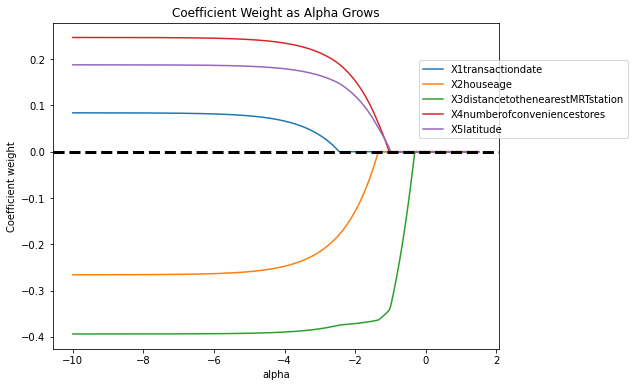

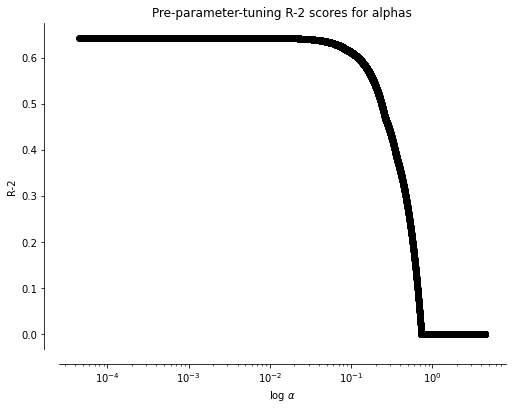

In [42]:
weight_vs_alpha_plot(weights, alphas, scores, features, True)

In [43]:
weights_vs_alphas(weights, alphas, features)

In [44]:
bay_ridge = BayesianRidge()
bay_feat = bay_ridge.fit(X_train, y_train)

#plot the scores
#plot_br_permutation_importance(bay_feat, _X_train, _y_train)

ss = model_selection.ShuffleSplit(n_splits=10, random_state=7)

cv_results = model_selection.cross_validate(bay_feat, X_train, 
                    y_train, cv=ss, scoring=['neg_mean_squared_error', 'explained_variance', 'r2'], n_jobs=5)

rmse["br"] = cv_results['test_neg_mean_squared_error'].tolist()
r2["br"] = cv_results['test_r2'].tolist()
expvarscore["br"] = cv_results['test_explained_variance'].tolist()

In [45]:
ypred_test = bay_ridge.predict(X_test)
ypred_test = standardy.inverse_transform(ypred_test)
yactual_test = standardy.inverse_transform(y_test)
ypred_train = bay_ridge.predict(X_train)
ypred_train = standardy.inverse_transform(ypred_train)
yactual_train = standardy.inverse_transform(y_train)
print(ypred_train)

[46.84579733 48.10964258 48.54999285 48.22430991 47.20519849 32.82753489
 38.68357074 46.51815271  9.87573753 34.93703363 33.10897249 53.48338333
 41.67307181 28.21933182 45.47851215 37.0601253  51.51535557 37.72992251
 46.82228647 48.99272518 36.18060637 49.66678406 30.26268229 48.4803383
 34.38578344 31.86386146 47.46288043 42.7426563  42.5064725  46.49163504
 14.08706579 40.65479794 30.49513836 46.47622329 47.68853616 33.44554553
 31.49636042 32.08155794 45.96090024 46.00085238 16.35864995 17.68305026
 35.89524482 40.07191129 48.0937146  39.46090324 46.6540942  36.46160378
 13.62015301 11.09329406 41.54931545 24.5301459  34.04584261 42.23133735
 45.70227899 23.86941881 42.66840739 47.07032979 14.08259412 41.33641719
 34.55978929 50.65627448 30.67062297 48.12474804 33.69141463 42.48845738
 48.19832633 47.27376682 42.48583822 45.85534229 54.3712557  34.62379215
 44.14876427 16.95187283 53.52946154 33.29511325 36.89568664 29.32027343
 32.44857918 29.29612559 44.9439884  37.89600398 46.

In [46]:
from sklearn.metrics import mean_squared_error, r2_score
#mse_train = mean_squared_error(yactual_train, ypred_train)
mse_test = mean_squared_error(yactual_test, ypred_test)
#r2_train = r2_score(yactual_train, ypred_train)
r2_test = r2_score(yactual_test, ypred_test)
print( mse_test, r2_test )

92.02591637521977 0.5154527561621616


In [47]:
plot_result(ypred_test, y_test, "Compression strength: Lasso Regression on Test set")

In [48]:
def plot_perm_importances( features, importances, plot_details : list):
        title, algorithm = plot_details
        fig = go.Figure()
        for name, result in zip( features, importances):
                fig.add_trace(go.Box(x=result, name=name, orientation='h'))
        fig.update_layout(title_text="Permutation Importances for "+ title,
                paper_bgcolor = 'rgb(251, 251, 251)',
                plot_bgcolor = 'rgb(251, 251, 251)',
                height=450, #width=1000, 
                margin=dict(
                        l=50,
                        r=20,
                        b=100,
                        t=100,
                        pad=10
                    ),
                xaxis=dict(gridcolor='DarkGrey', showline=True, linecolor='DarkGrey', zeroline=True, zerolinecolor='DarkGrey'),
                yaxis=dict(gridcolor='DarkGrey', showline=True, linecolor='DarkGrey', zeroline=True, zerolinecolor='DarkGrey'),
                )
        fig.show()

In [49]:
from sklearn.inspection import permutation_importance
import os
features = X_train.columns.values
result = permutation_importance(benchmark_dt, X_train, y_train, n_repeats=10,
                                random_state=42)
perm_sorted_idx = result.importances_mean.argsort()

tree_importance_sorted_idx = np.argsort(benchmark_dt.feature_importances_)
tree_indices = np.arange(0, len(benchmark_dt.feature_importances_)) + 0.5

#print(perm_sorted_idx,tree_importance_sorted_idx )
plot_perm_importances(features[perm_sorted_idx].tolist(), result.importances[perm_sorted_idx].T, [
    "Decision Tree Regression", "dtr"])

In [50]:
features = X_train.columns.values
result_lasso = permutation_importance(gridsearch_lasso_cv, X_train, y_train, n_repeats=10,
                        random_state=42)
perm_sorted_idx = result_lasso.importances_mean.argsort()

tree_importance_sorted_idx = np.argsort(gridsearch_lasso_cv.best_estimator_.coef_)
tree_indices = np.arange(0, len(gridsearch_lasso_cv.best_estimator_.coef_)) + 0.5

print(perm_sorted_idx,tree_importance_sorted_idx )

plot_perm_importances(features[perm_sorted_idx].tolist(), result_lasso.importances[perm_sorted_idx].T,[
    "Lasso Regression", "svr"])


[0 4 3 1 2] [2 1 0 4 3]


In [51]:
algorithms = {'dtr':'Decision Tree Regression', 'svr': 'Support Vector Regression', 
              'rfr':'Random Forest Regression', 'lr':'Lasso Regression', 'br':'Bayesian Ridge Regression'}
def plot_algorithm_comparison(results, scoring_name):
    # boxplot algorithm comparison
    fig = go.Figure()
    for name, result in results.items():
        fig.add_trace(go.Box(y=result, name=algorithms[name]))
    fig.update_layout(title_text=scoring_name+" : Algorithm comparison")
    fig.show()

In [52]:

plot_algorithm_comparison(rmse, "RMSE")
plot_algorithm_comparison(r2, "R^2")
plot_algorithm_comparison(expvarscore, "Explained Variance")


In [53]:
features = X_train.columns.values
result_rfr = permutation_importance(rfr_gridsearch_feat, X_train, y_train, n_repeats=10,
                            random_state=42)
perm_sorted_idx = result_rfr.importances_mean.argsort()

tree_importance_sorted_idx = np.argsort(rfr_gridsearch_feat.best_estimator_.feature_importances_)
tree_indices = np.arange(0, len(rfr_gridsearch_feat.best_estimator_.feature_importances_)) + 0.5

print(perm_sorted_idx,tree_importance_sorted_idx )

plot_perm_importances(features[perm_sorted_idx].tolist(), result_rfr.importances[perm_sorted_idx].T,[
"Random Forest Regression", "rfr"])

[0 3 4 1 2] [0 3 1 4 2]


In [54]:
features = X_train.columns.values
result_br = permutation_importance(bay_feat, X_train, y_train, n_repeats=10,
                            random_state=42)
perm_sorted_idx = result_br.importances_mean.argsort()

tree_importance_sorted_idx = np.argsort(bay_feat.coef_)
tree_indices = np.arange(0, len(bay_feat.coef_)) + 0.5

print(perm_sorted_idx,tree_importance_sorted_idx )
plot_perm_importances(features[perm_sorted_idx].tolist(), result_br.importances[perm_sorted_idx].T,[
"Bayesian Ridge Regression", "svr"])

[0 4 3 1 2] [2 1 0 4 3]
